In [1]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.spatial.distance import cdist

path = "D:/Pulkit/2017 Class-XII/Google Advanced Data Analytics Professional Certificate/6 - Nuts and Bolts of ML/Datasets/img/"

(275, 220, 3)

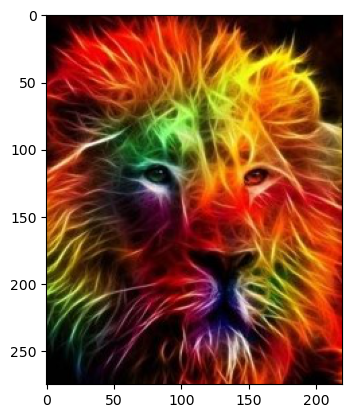

In [3]:
img0 = plt.imread(path + 'lion.jpg')
plt.imshow(img0)
img0.shape

In [4]:
img_flat = img0.reshape(275*220, 3)
img_flat

array([[  9,   1,   0],
       [ 10,   2,   0],
       [ 12,   0,   0],
       ...,
       [ 79,   3,   0],
       [109,  17,   0],
       [140,  37,   6]], dtype=uint8)

In [40]:
df_img = pd.DataFrame(img_flat, columns=['R', 'G', 'B'])
df_img.head()

,R,G,B
0,9,1,0
1,10,2,0
2,12,0,0
3,15,1,1
4,19,0,2


In [47]:
trace = go.Scatter3d(x=df_img.R, y=df_img.G, z=df_img.B, mode = 'markers', 
                     marker = dict(size = 1, color = ['rgb({},{},{})'.format(r,g,b) for r,g,b 
                                                      in zip(df_img.R, df_img.G, df_img.B)]))
layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0),
                               )

fig = go.Figure(data=[trace], layout=layout)
fig.update_layout(scene = dict(
                    xaxis_title='R',
                    yaxis_title='G',
                    zaxis_title='B'),
                  )
fig.show()

In [16]:
kmeans = KMeans(2, random_state=42)
kmeans.fit(img_flat)

KMeans(n_clusters=2, random_state=42)

In [18]:
cc = kmeans.cluster_centers_
cc

array([[ 59.38052032,  23.71444002,  14.80288862],
       [191.78104424, 101.17475175,  37.08869274]])

In [48]:
prediction = kmeans.predict(img_flat)
new_img = img_flat.copy()

In [49]:
for i,cluster in enumerate(prediction):
    new_img[i,:] = cc[cluster]

In [50]:
new_img

array([[59, 23, 14],
       [59, 23, 14],
       [59, 23, 14],
       ...,
       [59, 23, 14],
       [59, 23, 14],
       [59, 23, 14]], dtype=uint8)

In [51]:
df_nimg = pd.DataFrame(new_img, columns=['R', 'G', 'B'])
df_nimg.head()

trace = go.Scatter3d(x=df_nimg.R, y=df_nimg.G, z=df_nimg.B, mode = 'markers', 
                     marker = dict(size = 1, color = ['rgb({},{},{})'.format(r,g,b) for r,g,b 
                                                      in zip(df_nimg.R, df_nimg.G, df_nimg.B)]))
layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0),
                               )

fig = go.Figure(data=[trace], layout=layout)


# Add centroid to chart
fig.add_trace(
    go.Scatter3d(x = [cc[0]],
                 y = [cc[1]],
                 z = [cc[2]],
                 mode='markers',
                 marker=dict(size=7,
                             color=['rgb(125.79706706,78.8178776,42.58090169)'],
                             opacity=1))
)

fig.update_layout(scene = dict(
                    xaxis_title='R',
                    yaxis_title='G',
                    zaxis_title='B'),
                  )
fig.show()

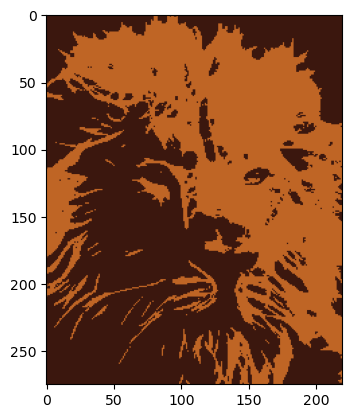

In [37]:
new_img = new_img.reshape(img0.shape)

#plt.scatter()
plt.imshow(new_img)

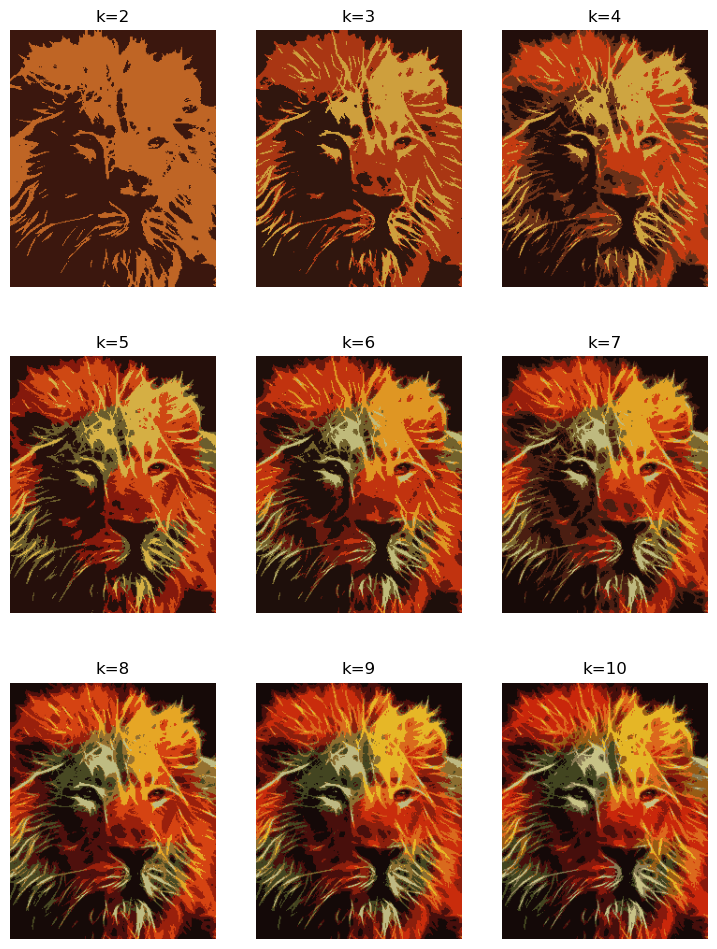

In [57]:
# Helper function to plot image grid
def cluster_image_grid(k, ax, img=img0):
    '''
    Fits a K-means model to a photograph.
    Replaces photo's pixels with RGB values of model's centroids.
    Displays the updated image on an axis of a figure.

    Args:
      k:    (int)          - Your selected K-value
      ax:   (int)          - Index of the axis of the figure to plot to
      img:  (numpy array)  - Your original image converted to a numpy array

    Returns:
      A new image where each row of img's array has been replaced with the \ 
      coordinates of its nearest centroid. Image is assigned to an axis that \
      can be used in an image grid figure.
    '''
    img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
    kmeans = KMeans(n_clusters=k, random_state=42).fit(img_flat)
    new_img = img_flat.copy()

    for i in np.unique(kmeans.labels_):
        new_img[kmeans.labels_==i, :] = kmeans.cluster_centers_[i]

    new_img = new_img.reshape(img.shape)
    ax.imshow(new_img)
    ax.axis('off')

fig, axs = plt.subplots(3, 3)
fig = plt.gcf()
fig.set_size_inches(9, 12)
axs = axs.flatten()
k_values = np.arange(2, 11)
for i, k in enumerate(k_values):
    cluster_image_grid(k, axs[i])
    axs[i].title.set_text('k=' + str(k))

(<matplotlib.image.AxesImage at 0x178e76509a0>, (-0.5, 219.5, 274.5, -0.5))

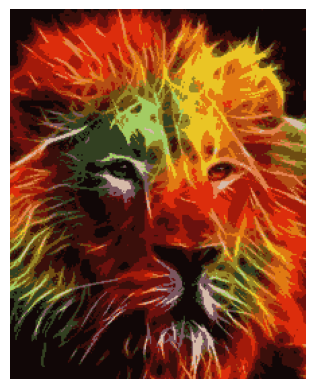

In [58]:
cluster_image(15)

In [10]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 15)

for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(img_flat)
    kmeanModel.fit(img_flat)
 
    distortions.append(sum(np.min(cdist(img_flat, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / img_flat.shape[0])
    inertias.append(kmeanModel.inertia_)
 
    mapping1[k] = sum(np.min(cdist(img_flat, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / img_flat.shape[0]
    mapping2[k] = kmeanModel.inertia_

In [11]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

1 : 93.45081612756357
2 : 59.76808760862139
3 : 49.42050598501096
4 : 43.82615691283539
5 : 40.85774498104384
6 : 38.19031110538738
7 : 35.3869798734278
8 : 33.55452889296366
9 : 31.962340685431112
10 : 30.985430085111396
11 : 30.106131378309232
12 : 29.013996246851704
13 : 28.287342315839616
14 : 27.519494797213316


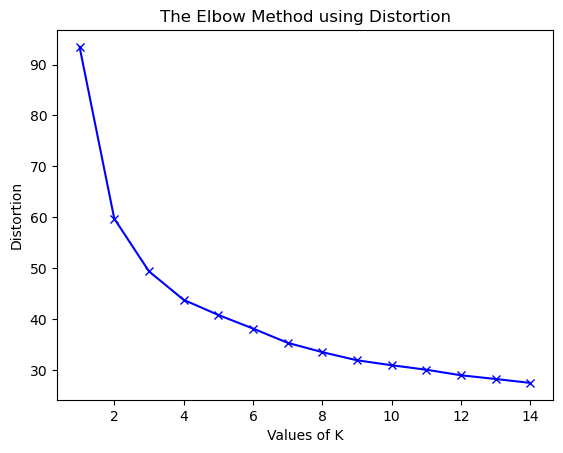

In [12]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

In [13]:
for key, val in mapping2.items():
    print(f'{key} : {val}')

1 : 637237397.9795362
2 : 275674878.55880255
3 : 182572115.8512903
4 : 148036409.5587411
5 : 127026157.2956721
6 : 108789471.04878241
7 : 95941311.20321268
8 : 86578514.37077004
9 : 78948064.31885019
10 : 73255676.64480418
11 : 68710290.48317823
12 : 64669151.23866968
13 : 61030927.38162158
14 : 57845215.616068706


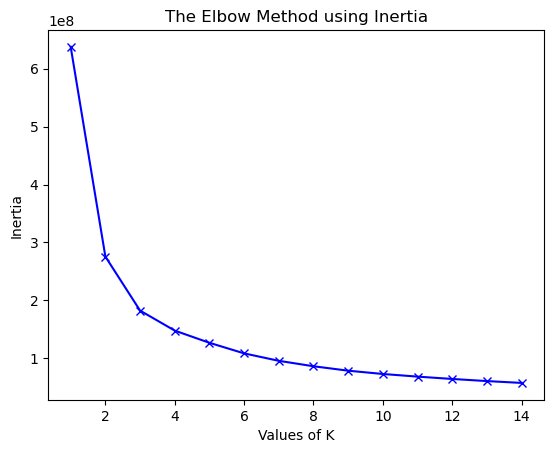

In [14]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()